In [ ]:
### STEPS

# tag correctamente
#1. rename files 14-02-17-hambre.wav > 140217hambre.wav
 for file in $(find . -type f -iname '*-*'); do   mv $file ${file//-/}; done
#2. etiquetar files 40217hambre.wav > 40217hambre-1-0-0.wav
 find . -name "*.wav" -exec sh -c 'mv "$1" "${1%.wav}-1-0-0.wav"' _ {} \;


#1. Crear carpeta test
#2. Poner etiqueta a todos los ficheros de la nueva carpeta 

#find . -name "*.wav" -exec sh -c 'mv "$1" "${1%.wav}-1-0-0.wav"' _ {} \;
    #0 air conditioning
    #1 children playing
    #2 dog bark
    
#3. Borrar ficheros de estas carpetas de mas de 10MG con 24bits (no los tolera)
#http://stackoverflow.com/questions/23095712/pydub-combining-audio-size-error

#4.Verificar definición de placeholders

#Referencias:
#http://www.kdnuggets.com/2016/09/urban-sound-classification-neural-networks-tensorflow.html
#https://github.com/aqibsaeed/Urban-Sound-Classification


In [14]:
import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.pyplot import specgram
%matplotlib inline

In [15]:
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 13

In [16]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

In [17]:
#SAMPLES 
#sound_file_paths = ["57320-0-0-7.wav","24074-1-0-3.wav","15564-2-0-1.wav","31323-3-0-1.wav","46669-4-0-35.wav",
#                   "89948-5-0-0.wav","40722-8-0-4.wav","103074-7-3-2.wav","106905-8-0-0.wav","108041-9-0-4.wav"]
#sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
#               "gun shot","jackhammer","siren","street music"]

#raw_sounds = load_sound_files(sound_file_paths)

In [20]:
sound_file_paths = ["/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/17021550422hambre-1-0-0.wav",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170218125549hambre-1-0-0.wav",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170220130517hambre-1-0-0.wav",

                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/no_hambre/170303113447angry-0-0-0.wav",
                   "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/no_hambre/170217212607enelcoche-0-0-0.wav",
                    "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/no_hambre/170220144404noneria-0-0-0.wav",
                 "/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/no_hambre/170327102830sueno-0-0-0.wav",

                   ]
                    
                   
sound_names = ["hambre", "hambre", "hambre", "enfado", "coche", "noneria", "sueno"]

raw_sounds = load_sound_files(sound_file_paths)

/Users/alaguna/anaconda/envs/tensorflow/lib/python2.7/site-packages/matplotlib/font_manager.py:1288: UserWarning: findfont: Font family [u'serif'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


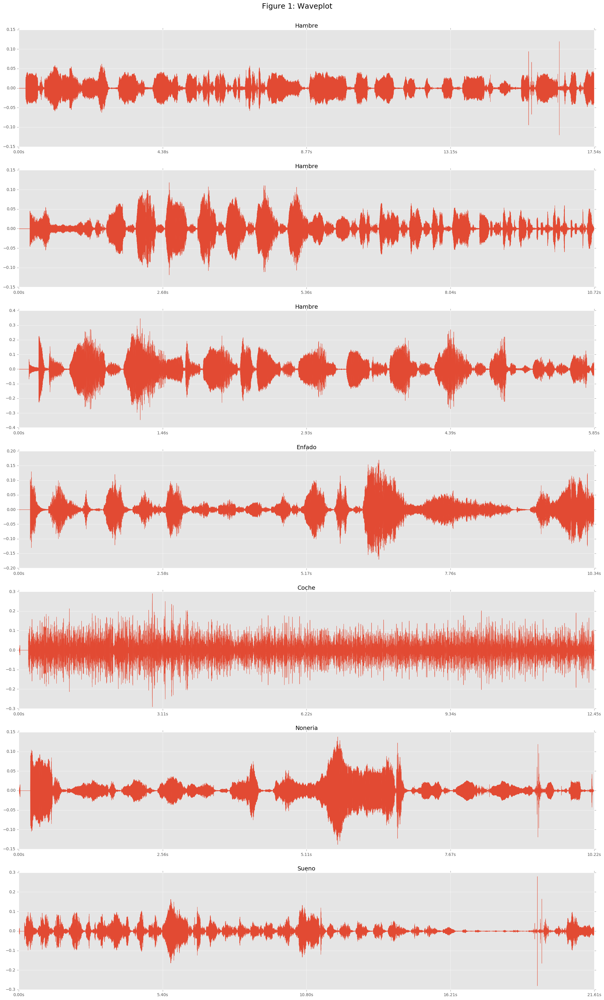

/Users/alaguna/anaconda/envs/tensorflow/lib/python2.7/site-packages/matplotlib/axes/_axes.py:7017: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


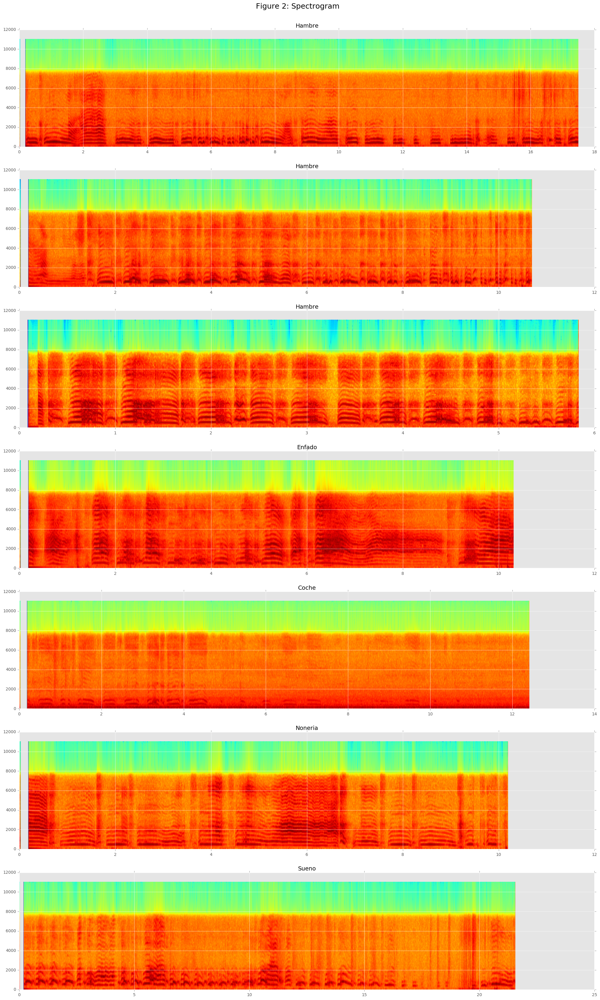

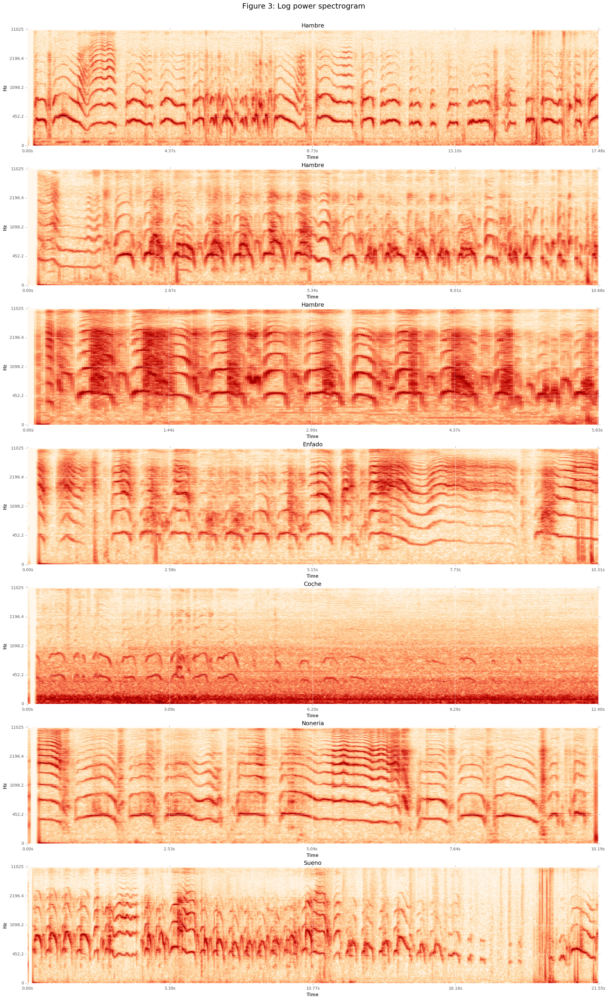

In [21]:
plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)

In [22]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

def parse_audio_files(parent_dir,sub_dirs,file_ext='*.wav'):
    features, labels = np.empty((0,193)), np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            print(fn) #wav
            print(fn.split('/')[10].split('-')[1])
            mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
            ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
            features = np.vstack([features,ext_features])
            #labels = np.append(labels, fn.split('/')[2].split('-')[1])
            labels = np.append(labels, fn.split('/')[10].split('-')[1])
    return np.array(features), np.array(labels, dtype = np.int)

def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    one_hot_encode[np.arange(n_labels), labels] = 1
    return one_hot_encode

In [23]:
#X, sample_rate = librosa.load("/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/dog_bark/14358-2-0-0.wav")


In [24]:
#parent_dir = '/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/'
parent_dir = '/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/'

#sub_dirs = ['dog_bark']
sub_dirs = ['hambre']

file_ext='*.wav'

features, labels = np.empty((0,193)), np.empty(0)
features, labels


for label, sub_dir in enumerate(sub_dirs):
    print(label)
    print(sub_dir)
    for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):#
        print(fn) #wav
        print(fn.split('/')[10].split('-')[1])
        mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
        #print(mfccs)
        ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
        #print(ext_features)
        features = np.vstack([features,ext_features])
        #print(features)
        labels = np.append(labels, fn.split('/')[10].split('-')[1])
        #print(labels)
    print(np.array(features), np.array(labels, dtype = np.int))

    

0
hambre
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/17021550422hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170218125549hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170220130517hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170221151654hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170221152155hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170221172334hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170228175924hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170228205027hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/

In [25]:
print features, labels

[[ -4.84640022e+02   1.17813358e+02  -1.15920341e+01 ...,  -7.76779489e-03
    7.45121316e-03  -6.57878005e-03]
 [ -4.05325632e+02   1.11172850e+02  -2.73376583e+01 ...,  -2.62863655e-02
   -2.56524632e-03   5.72143936e-03]
 [ -2.90712768e+02   1.17685301e+02  -6.50110099e+01 ...,   4.24017577e-02
    1.95037672e-03   1.23651255e-02]
 ..., 
 [ -3.45367111e+02   1.64278529e+02   1.02176181e+01 ...,  -1.50386606e-01
   -5.54829561e-02   2.86540319e-02]
 [ -2.66243822e+02   1.39959136e+02  -1.93632125e+01 ...,  -1.36152230e-01
    1.20429783e-03   3.22180279e-02]
 [ -4.08526075e+02   8.35868864e+01  -3.56805039e+01 ...,   4.91234796e-02
    2.22566368e-02   1.39226979e-02]] ['1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1' '1']


In [26]:
os.path.join(parent_dir, sub_dir, file_ext)

'/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/*.wav'

In [27]:
#### REAL DATA
### 3 classes

#parent_dir = '/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/UrbanSound/test/'
parent_dir = '/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/'

#sub_dirs = ['air_conditioner','children_playing','dog_bark']
sub_dirs = ['hambre','hablando']

file_ext='*.wav'

features, labels = parse_audio_files(parent_dir,sub_dirs,file_ext)
print(features)
print(labels)

/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/17021550422hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170218125549hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170220130517hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170221151654hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170221152155hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170221172334hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170228175924hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hambre/170228205027hambre-1-0-0.wav
1
/Users/alaguna/Desktop/Ana/DEEP_LEARNING/BabyCrying_Challenge/BabySound/data/hamb

In [28]:
import numpy as np

def convertToOneHot(vector, num_classes=None):
    """
    Converts an input 1-D vector of integers into an output
    2-D array of one-hot vectors, where an i'th input value
    of j will set a '1' in the i'th row, j'th column of the
    output array.

    Example:
        v = np.array((1, 0, 4))
        one_hot_v = convertToOneHot(v)
        print one_hot_v

        [[0 1 0 0 0]
         [1 0 0 0 0]
         [0 0 0 0 1]]
    """

    assert isinstance(vector, np.ndarray)
    assert len(vector) > 0

    if num_classes is None:
        num_classes = np.max(vector)+1
    else:
        assert num_classes > 0
        assert num_classes >= np.max(vector)

    result = np.zeros(shape=(len(vector), num_classes))
    result[np.arange(len(vector)), vector] = 1
    return result
    #return result.astype(int)

In [29]:
labels


array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [30]:
convertToOneHot(labels)


array([[ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.]])

In [31]:
labels = convertToOneHot(labels)
print(labels)
train_test_split = np.random.rand(len(features)) < 0.70
print(train_test_split)
train_x = features[train_test_split]
print(train_x)
print(train_x.shape)
train_y = labels[train_test_split]
print(train_y)
print(type(train_y))
print(train_y.shape)
print("---")
test_x = features[~train_test_split]
print(test_x)
test_y = labels[~train_test_split]
print(test_y)

[[ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]]
[False False  True  True  True False  True False False False  True False
  True  True  True  True False False  True False  True  True False  True
  True  True  True False False  True  True False  True False]
[[ -2.90712768e+02   1.17685301e+02  -6.50110099e+01 ...,   4.24017577e-02
    1.95037672e-03   1.23651255e-02]
 [ -4.51283328e+02   7.84153070e+01  -3.96281724e+01 ...,   1.69301994e-02
    3.06684260e-05   3.75881268e-03]
 [ -4.63825195e+02   6.54743724e+01  -4.02547762e+01 ...,   2.75805857e-03
   -1.53380769e-03   4.40195393e-03]
 ..., 
 [ -4.62764382e+02   7.07236372e+01  -3.06302799e+01 ...,   2.17979087e-02

In [32]:
import tensorflow as tf
from sklearn.metrics import precision_recall_fscore_support

In [33]:
print(labels)
print(features)

[[ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 0.  1.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]
 [ 1.  0.]]
[[ -4.84640022e+02   1.17813358e+02  -1.15920341e+01 ...,  -7.76779489e-03
    7.45121316e-03  -6.57878005e-03]
 [ -4.05325632e+02   1.11172850e+02  -2.73376583e+01 ...,  -2.62863655e-02
   -2.56524632e-03   5.72143936e-03]
 [ -2.90712768e+02   1.17685301e+02  -6.50110099e+01 ...,   4.24017577e-02
    1.95037672e-03   1.23651255e-02]
 ..., 
 [ -5.30828229e+02   5.35110207e+01  -1.37582563e+01 ...,  -4.46491512e-03
    3.84200896e-03  -3.50470043e-03]
 [ -5.24415216e+02   4.90663833e+01  -1.91609182e+01 ...,   1.12211853e-02
    3.14627903e-03  -9.47642466e-04]
 [ -6.36408369e+02   4.16149858e+01   2.73252671e+00 ..., 

In [34]:
print(features.shape)
print(labels.shape)

(34, 193)
(34, 2)


In [35]:
training_epochs = 5000
n_dim = features.shape[1]
print(n_dim)
n_classes = labels.shape[1] #3 #10  ### cambiar segun numero de clases a adivinar o columnas de labels
print(n_classes)
n_hidden_units_one = 280 
n_hidden_units_two = 300
sd = 1 / np.sqrt(n_dim)
learning_rate = 0.01

193
2


In [36]:
X = tf.placeholder(tf.float32,[None,n_dim])
print(X)
Y = tf.placeholder(tf.float32,[None,n_classes])
print(Y)


W_1 = tf.Variable(tf.random_normal([n_dim,n_hidden_units_one], mean = 0, stddev=sd))
b_1 = tf.Variable(tf.random_normal([n_hidden_units_one], mean = 0, stddev=sd))
h_1 = tf.nn.tanh(tf.matmul(X,W_1) + b_1)


W_2 = tf.Variable(tf.random_normal([n_hidden_units_one,n_hidden_units_two], mean = 0, stddev=sd))
b_2 = tf.Variable(tf.random_normal([n_hidden_units_two], mean = 0, stddev=sd))
h_2 = tf.nn.sigmoid(tf.matmul(h_1,W_2) + b_2)


W = tf.Variable(tf.random_normal([n_hidden_units_two,n_classes], mean = 0, stddev=sd))
b = tf.Variable(tf.random_normal([n_classes], mean = 0, stddev=sd))
y_ = tf.nn.softmax(tf.matmul(h_2,W) + b)

init = tf.initialize_all_variables()

Tensor("Placeholder:0", shape=(?, 193), dtype=float32)
Tensor("Placeholder_1:0", shape=(?, 2), dtype=float32)


In [37]:
init

In [38]:
cost_function = tf.reduce_mean(-tf.reduce_sum(Y * tf.log(y_), reduction_indices=[1])) 
print(cost_function)
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost_function)
print(optimizer)
correct_prediction = tf.equal(tf.argmax(y_,1), tf.argmax(Y,1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

Tensor("Mean:0", shape=(), dtype=float32)
name: "GradientDescent"
op: "NoOp"
input: "^GradientDescent/update_Variable/ApplyGradientDescent"
input: "^GradientDescent/update_Variable_1/ApplyGradientDescent"
input: "^GradientDescent/update_Variable_2/ApplyGradientDescent"
input: "^GradientDescent/update_Variable_3/ApplyGradientDescent"
input: "^GradientDescent/update_Variable_4/ApplyGradientDescent"
input: "^GradientDescent/update_Variable_5/ApplyGradientDescent"



In [39]:
import tensorflow as tf

sess = tf.Session()
sess.run(tf.initialize_all_variables())
print(sess)

In [ ]:
cost_history = np.empty(shape=[1],dtype=float)
print(cost_history)
y_true, y_pred = None, None
with tf.Session() as sess:
    sess.run(init)
    for epoch in range(training_epochs): 
        print(train_x.shape)
        print(train_y.shape)
        #cost = sess.run([cost_function],feed_dict={ X :train_x, Y:train_y})
        _,cost = sess.run([optimizer,cost_function],feed_dict={X:train_x ,Y:train_y})
        cost_history = np.append(cost_history,cost)
    print(_,cost)
    print(cost_history)
    #print("-----")
    y_pred = sess.run(tf.argmax(y_,1),feed_dict={X: test_x})
    print(y_pred)
    y_true = sess.run(tf.argmax(test_y,1))
    print(y_true)
    print('Test accuracy: ',round(sess.run(accuracy, feed_dict={X: test_x, Y: test_y}) , 3))

    

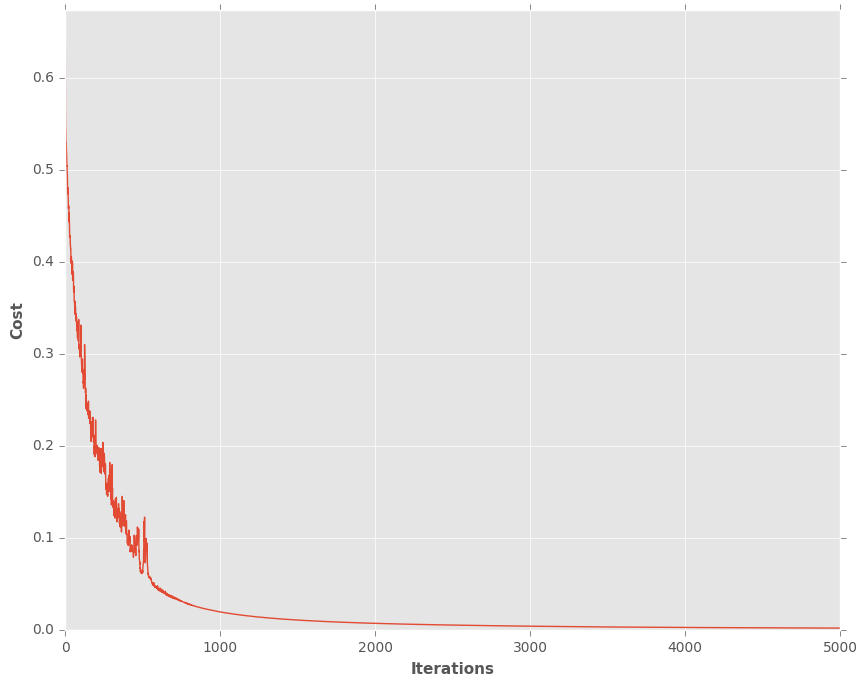

F-Score: 0.867
Precision: 0.867
Recall: 0.867


In [41]:
fig = plt.figure(figsize=(10,8))
plt.plot(cost_history)
plt.ylabel("Cost")
plt.xlabel("Iterations")
plt.axis([0,training_epochs,0,np.max(cost_history)])
plt.show()

p,r,f,s = precision_recall_fscore_support(y_true, y_pred, average='micro')
print "F-Score:", round(f,3)
print "Precision:", round(p,3)
print "Recall:", round(r,3)



In [ ]:
from tensorflow.python.ops.variables import Variable

for k, v in locals().items():
    if type(v) is Variable or type(v) is tf.Tensor:
        print("{0}: {1}".format(k, v))